In [37]:
import zipfile

with zipfile.ZipFile("road-accident-united-kingdom-uk-dataset.zip", "r") as file:
    file.extractall("road-accident-united-kingdom-uk-dataset")

In [38]:
import pandas as pd
import numpy as np
df = pd.read_csv("road-accident-united-kingdom-uk-dataset/UK_Accident.csv")
df.head()

,Unnamed: 0,Accident_Index,Location_Easting_OSGR,Location_Northing_OSGR,Longitude,Latitude,Police_Force,Accident_Severity,Number_of_Vehicles,Number_of_Casualties,...,Pedestrian_Crossing-Physical_Facilities,Light_Conditions,Weather_Conditions,Road_Surface_Conditions,Special_Conditions_at_Site,Carriageway_Hazards,Urban_or_Rural_Area,Did_Police_Officer_Attend_Scene_of_Accident,LSOA_of_Accident_Location,Year
0,0,200501BS00001,525680.0,178240.0,-0.191170,51.489096,1,2,1,1,...,Zebra crossing,Daylight: Street light present,Raining without high winds,Wet/Damp,NaN,NaN,1,Yes,E01002849,2005
1,1,200501BS00002,524170.0,181650.0,-0.211708,51.520075,1,3,1,1,...,Pedestrian phase at traffic signal junction,Darkness: Street lights present and lit,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002909,2005
2,2,200501BS00003,524520.0,182240.0,-0.206458,51.525301,1,3,2,1,...,No physical crossing within 50 meters,Darkness: Street lights present and lit,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002857,2005
3,3,200501BS00004,526900.0,177530.0,-0.173862,51.482442,1,3,1,1,...,No physical crossing within 50 meters,Daylight: Street light present,Fine without high winds,Dry,NaN,NaN,1,Yes,E01002840,2005
4,4,200501BS00005,528060.0,179040.0,-0.156618,51.495752,1,3,1,1,...,No physical crossing within 50 meters,Darkness: Street lighting unknown,Fine without high winds,Wet/Damp,NaN,NaN,1,Yes,E01002863,2005


In [39]:
df.drop(columns=['Unnamed: 0', 'Location_Easting_OSGR', 'Location_Northing_OSGR', 
                 'Local_Authority_(Highway)', 'LSOA_of_Accident_Location'], inplace=True)

In [40]:
df.columns

Index(['Accident_Index', 'Longitude', 'Latitude', 'Police_Force',
       'Accident_Severity', 'Number_of_Vehicles', 'Number_of_Casualties',
       'Date', 'Day_of_Week', 'Time', 'Local_Authority_(District)',
       '1st_Road_Class', '1st_Road_Number', 'Road_Type', 'Speed_limit',
       'Junction_Control', '2nd_Road_Class', '2nd_Road_Number',
       'Pedestrian_Crossing-Human_Control',
       'Pedestrian_Crossing-Physical_Facilities', 'Light_Conditions',
       'Weather_Conditions', 'Road_Surface_Conditions',
       'Special_Conditions_at_Site', 'Carriageway_Hazards',
       'Urban_or_Rural_Area', 'Did_Police_Officer_Attend_Scene_of_Accident',
       'Year'],
      dtype='object')

In [41]:
print("No. of rows: {}".format(df.shape[0]))
print("No. of cols: {}".format(df.shape[1]))

No. of rows: 1504150
No. of cols: 28


In [42]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1504150 entries, 0 to 1504149
Data columns (total 28 columns):
 #   Column                                       Non-Null Count    Dtype  
---  ------                                       --------------    -----  
 0   Accident_Index                               1504150 non-null  object 
 1   Longitude                                    1504049 non-null  float64
 2   Latitude                                     1504150 non-null  float64
 3   Police_Force                                 1504150 non-null  int64  
 4   Accident_Severity                            1504150 non-null  int64  
 5   Number_of_Vehicles                           1504150 non-null  int64  
 6   Number_of_Casualties                         1504150 non-null  int64  
 7   Date                                         1504150 non-null  object 
 8   Day_of_Week                                  1504150 non-null  int64  
 9   Time                                         1

In [43]:
df.drop(columns=['Accident_Index', 'Date', 'Time'], inplace=True)

In [44]:
df.isna().any()

Longitude                                       True
Latitude                                       False
Police_Force                                   False
Accident_Severity                              False
Number_of_Vehicles                             False
Number_of_Casualties                           False
Day_of_Week                                    False
Local_Authority_(District)                     False
1st_Road_Class                                 False
1st_Road_Number                                False
Road_Type                                      False
Speed_limit                                    False
Junction_Control                                True
2nd_Road_Class                                 False
2nd_Road_Number                                False
Pedestrian_Crossing-Human_Control               True
Pedestrian_Crossing-Physical_Facilities         True
Light_Conditions                               False
Weather_Conditions                            

In [45]:
df.isnull().sum() / len(df) * 100

Longitude                                       0.006715
Latitude                                        0.000000
Police_Force                                    0.000000
Accident_Severity                               0.000000
Number_of_Vehicles                              0.000000
Number_of_Casualties                            0.000000
Day_of_Week                                     0.000000
Local_Authority_(District)                      0.000000
1st_Road_Class                                  0.000000
1st_Road_Number                                 0.000000
Road_Type                                       0.000000
Speed_limit                                     0.000000
Junction_Control                               40.078117
2nd_Road_Class                                  0.000000
2nd_Road_Number                                 0.000000
Pedestrian_Crossing-Human_Control               0.001130
Pedestrian_Crossing-Physical_Facilities         0.002260
Light_Conditions               

In [46]:
df.dropna(subset=['Longitude'], inplace=True)

In [47]:
dup_rows = df[df.duplicated()]
print("No. of duplicate rows: ", dup_rows.shape[0])

No. of duplicate rows:  34789


In [48]:
df.drop_duplicates(inplace=True)
print("No. of rows remaining: ", df.shape[0])

No. of rows remaining:  1469260


In [49]:
import pandas as pd

# Loop through all columns
for col in df.columns:
    print(f"\nColumn: {col}")
    print("-" * (9 + len(col)))

    # Get value counts including NaN
    value_counts = df[col].value_counts(dropna=False)

    for val, count in value_counts.items():
        display_val = "NaN" if pd.isna(val) else val
        print(f"{display_val}: {count} times")



Column: Longitude
------------------
-0.977611: 55 times
-1.871043: 49 times
-0.104426: 46 times
-3.310596: 43 times
-1.234393: 41 times
-0.173445: 41 times
-3.241694: 40 times
0.029272: 37 times
-0.816789: 37 times
-0.056477: 36 times
-1.216694: 36 times
-1.999967: 36 times
-1.181848: 35 times
-0.107119: 35 times
-1.265368: 33 times
-0.115063: 32 times
-1.190861: 32 times
-1.25022: 32 times
-1.192286: 32 times
-1.968315: 32 times
-0.099368: 32 times
-1.841695: 31 times
-0.077209: 31 times
-0.130181: 31 times
-0.096011: 31 times
-0.318182: 30 times
-0.217197: 30 times
-2.094349: 30 times
-2.948497: 30 times
-1.751772: 30 times
-0.150108: 30 times
-1.958634: 29 times
-1.120286: 29 times
-1.974206: 29 times
-1.84858: 29 times
-0.375603: 29 times
-0.130517: 29 times
-1.190402: 28 times
-0.163926: 28 times
-2.004398: 27 times
-2.000557: 27 times
-1.949467: 27 times
-1.268906: 27 times
-1.893857: 27 times
-0.172764: 27 times
-0.113347: 27 times
-1.16265: 27 times
-0.10457: 27 times
-0.2121

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)




-1.148858: 1 times
-1.202688: 1 times
-1.188589: 1 times
-1.135615: 1 times
-1.131157: 1 times
-1.15267: 1 times
-1.183697: 1 times
-1.217689: 1 times
-1.203358: 1 times
-1.225114: 1 times
-1.137953: 1 times
-1.185385: 1 times
-1.14648: 1 times
-1.184456: 1 times
-1.158115: 1 times
-1.205566: 1 times
-1.159415: 1 times
-1.228307: 1 times
-1.195355: 1 times
-1.157288: 1 times
-1.188506: 1 times
-1.178363: 1 times
-1.19389: 1 times
-1.242651: 1 times
-1.18292: 1 times
-1.191562: 1 times
-1.174634: 1 times
-1.155399: 1 times
-1.159417: 1 times
-1.186103: 1 times
-1.127443: 1 times
-1.149659: 1 times
-1.170792: 1 times
-0.241599: 1 times
-0.226868: 1 times
-0.245859: 1 times
-0.176293: 1 times
-1.236507: 1 times
-1.174189: 1 times
-1.14645: 1 times
-1.154326: 1 times
-1.160286: 1 times
-1.180279: 1 times
-1.16994: 1 times
-1.176914: 1 times
-1.196236: 1 times
-1.179232: 1 times
-1.119974: 1 times
-1.164722: 1 times
-1.123577: 1 times
-1.233826: 1 times
-1.146367: 1 times
-1.189026: 1 time

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



52.645899: 1 times
52.842626: 1 times
52.671019: 1 times
52.633562: 1 times
52.619297: 1 times
52.624718: 1 times
52.54677: 1 times
52.806215: 1 times
52.79893: 1 times
53.732041: 1 times
53.822689: 1 times
52.636065: 1 times
52.760309: 1 times
52.79322: 1 times
52.765914: 1 times
52.64067: 1 times
52.510299: 1 times
52.779166: 1 times
52.739288: 1 times
52.755873: 1 times
52.747051: 1 times
52.792985: 1 times
52.633764: 1 times
52.629122: 1 times
52.552978: 1 times
52.662378: 1 times
52.586535: 1 times
52.405921: 1 times
52.629831: 1 times
52.594111: 1 times
52.761234: 1 times
52.671956: 1 times
52.684629: 1 times
52.730179: 1 times
52.780205: 1 times
52.64569: 1 times
53.731561: 1 times
53.797319: 1 times
53.706267: 1 times
53.786034: 1 times
53.825917: 1 times
52.481675: 1 times
52.645892: 1 times
52.727976: 1 times
52.634284: 1 times
52.665586: 1 times
52.650857: 1 times
52.473905: 1 times
52.716455: 1 times
52.6638: 1 times
52.6713: 1 times
52.721691: 1 times
52.737004: 1 times
52

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



In [50]:
df = df[~df['Weather_Conditions'].isin(['Other', 'Unknown'])]
df.reset_index(drop=True, inplace=True)
print(df['Weather_Conditions'].unique())

['Raining without high winds' 'Fine without high winds'
 'Snowing without high winds' 'Fine with high winds'
 'Raining with high winds' 'Fog or mist' 'Snowing with high winds']


In [51]:
df['Speed_limit'] = df['Speed_limit'].replace({10: 20, 15: 20})

In [52]:
df = df[~df['Number_of_Vehicles'].isin([11,12,13,14,16,18,15,19,20,17,22,28,32,29,67])]
df.reset_index(drop=True, inplace=True)

In [53]:
df['Number_of_Vehicles'] = pd.to_numeric(df['Number_of_Vehicles'], errors='coerce')
df.dropna(subset=['Number_of_Vehicles'], inplace=True)
df['Number_of_Vehicles'] = df['Number_of_Vehicles'].apply(lambda x: '5+' if x >= 5 else int(x))
print(df['Number_of_Vehicles'].unique())

[1 2 4 3 '5+']


In [54]:
df['Number_of_Casualties'] = pd.to_numeric(df['Number_of_Casualties'], errors='coerce')
df.dropna(subset=['Number_of_Casualties'], inplace=True)
df['Number_of_Casualties'] = df['Number_of_Casualties'].apply(lambda x: "8+" if x >= 8 else int(x))
print(df['Number_of_Casualties'].unique())

[1 2 5 4 3 '8+' 7 6]


In [55]:
df.dropna(subset=['Pedestrian_Crossing-Physical_Facilities'], inplace=True)

In [56]:
df = df[~df['Urban_or_Rural_Area'].isin([3])]
df.reset_index(drop=True, inplace=True)
print(df['Urban_or_Rural_Area'].unique())

[1 2]


In [57]:
import joblib
from sklearn.preprocessing import LabelEncoder

def fit_and_save_label_encoders(df, cat_cols, file_path='label_encoders.pkl'):
    """
    Fits LabelEncoders for each column in categorical_columns and saves them as a dictionary.
    """
    label_encoders = {}
    df_encoded = df.copy()

    for col in cat_cols:
        le = LabelEncoder()
        df_encoded[col] = le.fit_transform(df_encoded[col].astype(str))
        label_encoders[col] = le

    joblib.dump(label_encoders, file_path)
    print(f"✅ Saved LabelEncoders to '{file_path}'")

    return df_encoded

In [58]:
cat_cols=[feature for feature in df.columns if df[feature].dtype=='O']
for feature in cat_cols:
    print(f'The {feature} has following number of {len(df[feature].unique())}')

The Number_of_Vehicles has following number of 5
The Number_of_Casualties has following number of 8
The Road_Type has following number of 6
The Junction_Control has following number of 5
The Pedestrian_Crossing-Human_Control has following number of 4
The Pedestrian_Crossing-Physical_Facilities has following number of 6
The Light_Conditions has following number of 5
The Weather_Conditions has following number of 7
The Road_Surface_Conditions has following number of 6
The Special_Conditions_at_Site has following number of 8
The Carriageway_Hazards has following number of 6
The Did_Police_Officer_Attend_Scene_of_Accident has following number of 2


In [59]:
cat_cols=[feature for feature in df.columns if df[feature].dtype=='O']
df = fit_and_save_label_encoders(df, cat_cols)

✅ Saved LabelEncoders to 'label_encoders.pkl'


In [60]:
target = "Accident_Severity"
X = df.drop(columns=[target])
y = df[target]

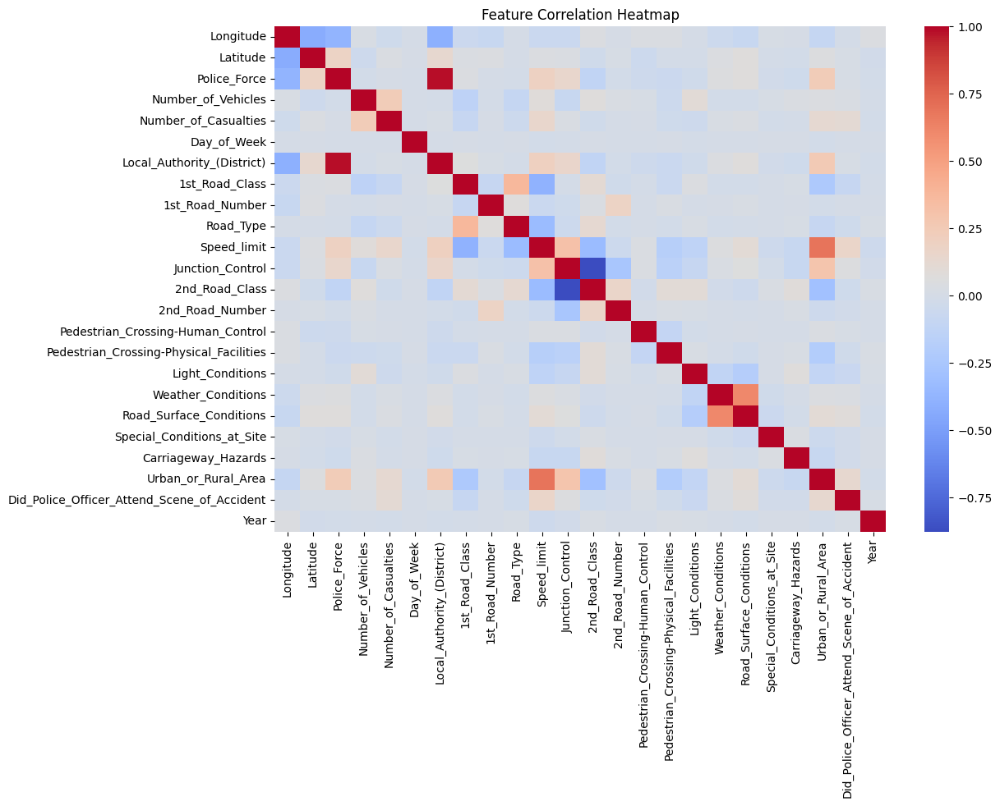

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
plt.figure(figsize=(12, 8))
sns.heatmap(X.corr(), cmap="coolwarm", annot=False)
plt.title("Feature Correlation Heatmap")
plt.show()

In [62]:
corr_matrix = X.corr().abs()
upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper.columns if any(upper[column] > 0.85)]
X.drop(columns=to_drop, inplace=True)
print(f"Dropped highly correlated features: {to_drop}")

Dropped highly correlated features: ['Local_Authority_(District)', '2nd_Road_Class']


In [63]:
df = df[[col for col in df.columns if col != target] + [target]]

In [64]:
from sklearn.feature_selection import mutual_info_classif
mi_scores = mutual_info_classif(X, y)
mi_series = pd.Series(mi_scores, index=X.columns).sort_values(ascending=False)

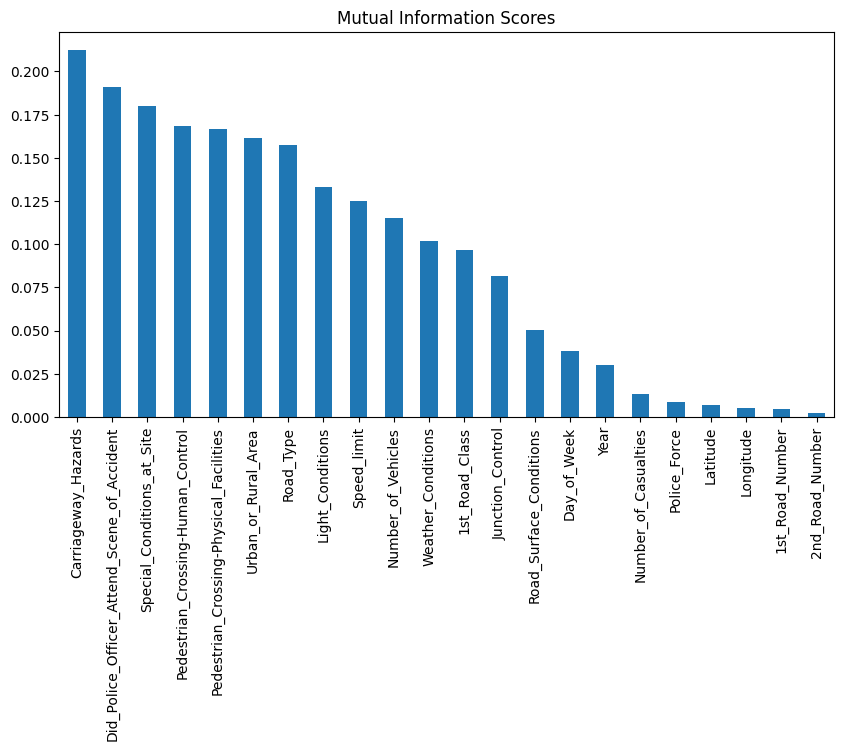

In [65]:
plt.figure(figsize=(10, 5))
mi_series.plot(kind="bar", title="Mutual Information Scores")
plt.show()

In [66]:
top_mi_features = mi_series.head(17).index.tolist()
print(f"Top 17 Features (Mutual Information): {top_mi_features}")

Top 17 Features (Mutual Information): ['Carriageway_Hazards', 'Did_Police_Officer_Attend_Scene_of_Accident', 'Special_Conditions_at_Site', 'Pedestrian_Crossing-Human_Control', 'Pedestrian_Crossing-Physical_Facilities', 'Urban_or_Rural_Area', 'Road_Type', 'Light_Conditions', 'Speed_limit', 'Number_of_Vehicles', 'Weather_Conditions', '1st_Road_Class', 'Junction_Control', 'Road_Surface_Conditions', 'Day_of_Week', 'Year', 'Number_of_Casualties']


In [67]:
df= df[top_mi_features + [target]]

In [68]:
df.drop(columns=['Carriageway_Hazards', 'Did_Police_Officer_Attend_Scene_of_Accident', 'Special_Conditions_at_Site', 
                 'Pedestrian_Crossing-Human_Control', '1st_Road_Class','Year'], inplace=True)

In [69]:
df=df[['Weather_Conditions','Road_Surface_Conditions','Light_Conditions','Urban_or_Rural_Area','Road_Type','Speed_limit','Number_of_Vehicles','Number_of_Casualties','Day_of_Week','Junction_Control','Pedestrian_Crossing-Physical_Facilities','Accident_Severity']]

In [70]:
df.head()

,Weather_Conditions,Road_Surface_Conditions,Light_Conditions,Urban_or_Rural_Area,Road_Type,Speed_limit,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Junction_Control,Pedestrian_Crossing-Physical_Facilities,Accident_Severity
0,4,5,4,1,3,30,0,0,3,4,4,2
1,1,0,2,1,0,30,0,0,4,1,3,3
2,1,0,2,1,3,30,1,0,5,4,2,3
3,1,0,4,1,3,30,0,0,6,4,2,3
4,1,5,1,1,3,30,0,0,2,4,2,3


In [71]:
df['Accident_Severity']=df['Accident_Severity'].map({1:0,2:1,3:2})

In [72]:
df.Accident_Severity.value_counts()

Accident_Severity
2    1197199
1     192651
0      18500
Name: count, dtype: int64

Text(0, 0.5, 'Total Number Of Individual Category')

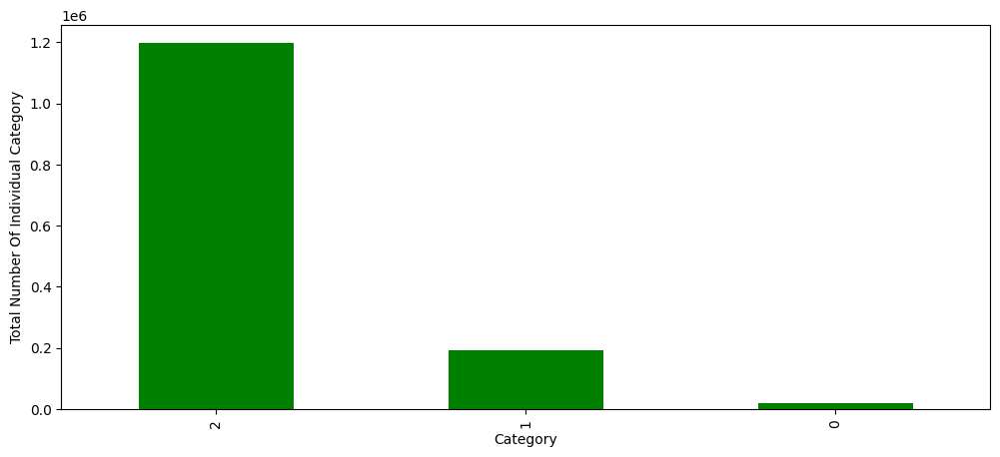

In [73]:
df.Accident_Severity.value_counts().plot(figsize=(12,5),kind='bar',color='green')
plt.xlabel('Category')
plt.ylabel('Total Number Of Individual Category')

In [74]:
target = "Accident_Severity"
X = df.drop(columns=[target])
y = df[target]

In [75]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1, shuffle=True,  stratify=y)

In [76]:
y_train.value_counts()

Accident_Severity
2    957759
1    154121
0     14800
Name: count, dtype: int64

In [77]:
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier

In [78]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

RandomForestClassifier()

In [79]:
y_pred_rf = rf_model.predict(X_test)
from sklearn.metrics import accuracy_score,classification_report
score=accuracy_score(y_test,y_pred_rf)
print(score)

0.8443959243085881


In [80]:
xgb_model = XGBClassifier(eval_metric='logloss', random_state=42)
xgb_model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [81]:
y_pred_xgb = xgb_model.predict(X_test)
accuracy_xgb = accuracy_score(y_test, y_pred_xgb)
print("XGBoost Accuracy:", accuracy_xgb)

XGBoost Accuracy: 0.8499698228423332


In [82]:
xgb_train_preds = xgb_model.predict_proba(X_train)[:, 1].reshape(-1, 1)
rf_train_preds = rf_model.predict_proba(X_train)[:, 1].reshape(-1, 1)

xgb_test_preds = xgb_model.predict_proba(X_test)[:, 1].reshape(-1, 1)
rf_test_preds = rf_model.predict_proba(X_test)[:, 1].reshape(-1, 1)

In [83]:
stacked_X_train = np.hstack((xgb_train_preds, rf_train_preds))
stacked_X_test = np.hstack((xgb_test_preds, rf_test_preds))

In [84]:
from sklearn.preprocessing import StandardScaler

In [85]:
scaler = StandardScaler()
train_meta_scaled = scaler.fit_transform(stacked_X_train)
test_meta_scaled = scaler.transform(stacked_X_test)

In [86]:
df.head()

,Weather_Conditions,Road_Surface_Conditions,Light_Conditions,Urban_or_Rural_Area,Road_Type,Speed_limit,Number_of_Vehicles,Number_of_Casualties,Day_of_Week,Junction_Control,Pedestrian_Crossing-Physical_Facilities,Accident_Severity
0,4,5,4,1,3,30,0,0,3,4,4,1
1,1,0,2,1,0,30,0,0,4,1,3,2
2,1,0,2,1,3,30,1,0,5,4,2,2
3,1,0,4,1,3,30,0,0,6,4,2,2
4,1,5,1,1,3,30,0,0,2,4,2,2


In [87]:
from sklearn.linear_model import LogisticRegression
meta_model = LogisticRegression()
meta_model.fit(train_meta_scaled, y_train)

LogisticRegression()

In [88]:
final_preds = meta_model.predict(test_meta_scaled)

In [89]:
accuracy = accuracy_score(y_test, final_preds)
print(f"Stacking Model Accuracy: {accuracy * 100:.2f}%")

Stacking Model Accuracy: 83.94%


In [90]:
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from xgboost import XGBClassifier

In [91]:
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
xgb_model = XGBClassifier(n_estimators=100, eval_metric='logloss', use_label_encoder=False, random_state=42)

In [92]:
meta_model = Pipeline([
    ('scaler', StandardScaler()),
    ('lr', LogisticRegression())
])

In [93]:
stacked_clf = StackingClassifier(
    estimators=[('rf', rf_model), ('xgb', xgb_model)],
    final_estimator=meta_model,
    passthrough=True,
    cv=5
)

In [94]:
stacked_clf.fit(X_train, y_train)

C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [18:59:32] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [19:06:04] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [19:06:10] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
C:\Users\Asus\AppData\Local\Programs\Python\Python313\Lib\site-packages\xgboost\training.py:183: UserWarning: [19:06:16] WARNING: C:\actions-r

StackingClassifier(cv=5,
                   estimators=[('rf', RandomForestClassifier(random_state=42)),
                               ('xgb',
                                XGBClassifier(base_score=None, booster=None,
                                              callbacks=None,
                                              colsample_bylevel=None,
                                              colsample_bynode=None,
                                              colsample_bytree=None,
                                              device=None,
                                              early_stopping_rounds=None,
                                              enable_categorical=False,
                                              eval_metric='logloss',
                                              feature_types=None,
                                              feature_weights=None, gamma=Non...
                                              learning_rate=None, max_bin=None,
                                              max_cat_threshold=None,
                                              max_cat_to_onehot=None,
                                              max_delta_step=None,
                                              max_depth=None, max_leaves=None,
                                              min_child_weight=None,
                                              missing=nan,
                                              monotone_constraints=None,
                                              multi_strategy=None,
                                              n_estimators=100, n_jobs=None,
                                              num_parallel_tree=None, ...))],
                   final_estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                                   ('lr',
                                                    LogisticRegression())]),
                   passthrough=True)

In [95]:
joblib.dump(stacked_clf, 'accident_severity_model.pkl')
print("✅ Model saved as accident_severity_model.pkl")

✅ Model saved as accident_severity_model.pkl


In [96]:
joblib.dump(X_train.columns.tolist(), 'feature_order.pkl')

['feature_order.pkl']